In [0]:
!wget https://proai-datasets.s3.eu-west-3.amazonaws.com/wikipedia.csv

--2024-06-15 10:10:15--  https://proai-datasets.s3.eu-west-3.amazonaws.com/wikipedia.csv
Resolving proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)... 16.12.19.6, 16.12.18.34
Connecting to proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)|16.12.19.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1003477941 (957M) [text/csv]
Saving to: ‘wikipedia.csv’

wikipedia.csv       100%[===================>] 956.99M  18.3MB/s    in 66s     

2024-06-15 10:11:22 (14.5 MB/s) - ‘wikipedia.csv’ saved [1003477941/1003477941]



In [0]:
from pyspark.sql import SparkSession

# Configurazione della sessione Spark con memoria aumentata e G1GC
spark = SparkSession.builder \
    .appName("TextClassification") \
    .config("spark.executor.memory", "4g") \
    .config("spark.driver.memory", "4g") \
    .config("spark.executor.memoryOverhead", "1g") \
    .config("spark.executor.extraJavaOptions", "-XX:+UseG1GC") \
    .config("spark.driver.extraJavaOptions", "-XX:+UseG1GC") \
    .getOrCreate()

In [0]:
# librerie necessarie per l'elaborazione del linguaggio naturale (NLP)
!pip install wordcloud nltk spacy

# modello linguistico "en_core_web_sm" per la lingua inglese utilizzando spaCy
!python3 -m spacy download en_core_web_sm

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 46.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 64.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 775.1/775.1 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.1/46.1 kB 204.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.4/922.4 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 355.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.0/182.0 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 141.9 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.0/493.0 kB 3.2 MB/s eta 0:00:00
     ━━━━

In [0]:
import re
import pandas as pd
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, Tokenizer, HashingTF, IDF
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from wordcloud import WordCloud, STOPWORDS

# Scarica risorse per nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [0]:
dataset = pd.read_csv('/databricks/driver/wikipedia.csv')
spark_df = spark.createDataFrame(dataset)
spark_df = spark_df.drop("Unnamed: 0").withColumnRenamed("categoria", "category")
spark_df.createOrReplaceTempView("wikipedia")
display(spark_df)

title summary documents category economics economics () is a social science that studies the production, distribution, and consumption of goods and services.economics focuses on the behaviour and interactions of economic agents and how economies work. microeconomics analyzes what's viewed as basic elements in the economy, including individual agents and markets, their interactions, and the outcomes of interactions. individual agents may include, for example, households, firms, buyers, and sellers. macroeconomics analyzes the economy as a system where production, consumption, saving, and investment interact, and factors affecting it: employment of the resources of labour, capital, and land, currency inflation, economic growth, and public policies that have impact on these elements. other broad distinctions within economics include those between positive economics, describing "what is", and normative economics, advocating "what ought to be"; between economic theory and applied economics; between rational and behavioural economics; and between mainstream economics and heterodox economics.economic analysis can be applied throughout society, including business, finance, cybersecurity, health care, engineering and government. it is also applied to such diverse subjects as crime, education, the family, feminism, law, philosophy, politics, religion, social institutions, war, science, and the environment. economics () is a social science that studies the production, distribution, and consumption of goods and services.economics focuses on the behaviour and interactions of economic agents and how economies work. microeconomics analyzes what's viewed as basic elements in the economy, including individual agents and markets, their interactions, and the outcomes of interactions. individual agents may include, for example, households, firms, buyers, and sellers. macroeconomics analyzes the economy as a system where production, consumption, saving, and investment interact, and factors affecting it: employment of the resources of labour, capital, and land, currency inflation, economic growth, and public policies that have impact on these elements. other broad distinctions within economics include those between positive economics, describing "what is", and normative economics, advocating "what ought to be"; between economic theory and applied economics; between rational and behavioural economics; and between mainstream economics and heterodox economics.economic analysis can be applied throughout society, including business, finance, cybersecurity, health care, engineering and government. it is also applied to such diverse subjects as crime, education, the family, feminism, law, philosophy, politics, religion, social institutions, war, science, and the environment. definitions of economics over time the earlier term for the discipline was 'political economy', but since the late 19th century, it has commonly been called 'economics'. the term is ultimately derived from ancient greek οἰκονομία (oikonomia) which is a term for the "way (nomos) to run a household (oikos)", or in other words the know-how of an οἰκονομικός (oikonomikos), or "household or homestead manager". derived terms such as "economy" can therefore often mean "frugal" or "thrifty". by extension then, "political economy" was the way to manage a polis or state. there are a variety of modern definitions of economics; some reflect evolving views of the subject or different views among economists. scottish philosopher adam smith (1776) defined what was then called political economy as "an inquiry into the nature and causes of the wealth of nations", in particular as: a branch of the science of a statesman or legislator [with the twofold objectives of providing] a plentiful revenue or subsistence for the people ... [and] to supply the state or commonwealth with a revenue for the publick services. jean-baptiste say (1803), distinguishing the subject matter from its public-policy uses, defi

# Valori mancanti o doppi

In [0]:
print("Nel dataset non elaborato ci sono {} record".format(spark_df.count()))

Nel dataset non elaborato ci sono 153232 record


In [0]:
# Rimozione dei valori nulli
spark_df = spark_df.dropna(subset=["summary", "documents", "category"])

# Rimozione dei duplicati
spark_df = spark_df.dropDuplicates()

print("Nel dataset elaborato ci sono {} record".format(spark_df.count()))

Nel dataset elaborato ci sono 75523 record


# Numero di articoli

In [0]:
df_1_sql = spark.sql("""
    select category, count(*) as count
    from wikipedia
    group by category
""")
display(df_1_sql)

# eseguo una query SQL su spark, selezionando la colonna category da wikipedia e contando tutte le occorrenze per ogni categoria e le raggruppo.

category,count
economics,10110
politics,11358
culture,10372
science,10236
sports,10068
energy,10046
finance,10157
humanities,10236
pets,10023
trade,10068


# Numero medio di parole utilizzate

In [0]:
# Query che ci permette di filtrare le parole che consistono in sola punteggiatura o caratteri speciali
array_df = spark.sql("""
    SELECT 
        category, 
        FILTER(
            SPLIT(documents, ' '), 
            word -> NOT regexp_like(word, '^[!"#$%&)(*,-./:;<=>?@–\\^_`{|}~+]+$')
        ) AS filtered_words
    FROM wikipedia
""")
# SPLIT divide la stringa nella colonna documents in un array di parole, utilizzando lo spazio come delimitatore.
# word restituisce TRUE se la parola non corrisponde al pattern di caratteri speciali specificato.

# Creazione della vista temporanea "words_array"
array_df.createOrReplaceTempView("words_array")

display(array_df)

category filtered_words economics List(economics, is, a, social, science, that, studies, the, production,, distribution,, and, consumption, of, goods, and, services.economics, focuses, on, the, behaviour, and, interactions, of, economic, agents, and, how, economies, work., microeconomics, analyzes, what's, viewed, as, basic, elements, in, the, economy,, including, individual, agents, and, markets,, their, interactions,, and, the, outcomes, of, interactions., individual, agents, may, include,, for, example,, households,, firms,, buyers,, and, sellers., macroeconomics, analyzes, the, economy, as, a, system, where, production,, consumption,, saving,, and, investment, interact,, and, factors, affecting, it:, employment, of, the, resources, of, labour,, capital,, and, land,, currency, inflation,, economic, growth,, and, public, policies, that, have, impact, on, these, elements., other, broad, distinctions, within, economics, include, those, between, positive, economics,, describing, "what, is",, and, normative, economics,, advocating, "what, ought, to, be";, between, economic, theory, and, applied, economics;, between, rational, and, behavioural, economics;, and, between, mainstream, economics, and, heterodox, economics.economic, analysis, can, be, applied, throughout, society,, including, business,, finance,, cybersecurity,, health, care,, engineering, and, government., it, is, also, applied, to, such, diverse, subjects, as, crime,, education,, the, family,, feminism,, law,, philosophy,, politics,, religion,, social, institutions,, war,, science,, and, the, environment., definitions, of, economics, over, time, the, earlier, term, for, the, discipline, was, 'political, economy',, but, since, the, late, 19th, century,, it, has, commonly, been, called, 'economics'., the, term, is, ultimately, derived, from, ancient, greek, οἰκονομία, (oikonomia), which, is, a, term, for, the, "way, (nomos), to, run, a, household, (oikos)",, or, in, other, words, the, know-how, of, an, οἰκονομικός, (oikonomikos),, or, "household, or, homestead, manager"., derived, terms, such, as, "economy", can, therefore, often, mean, "frugal", or, "thrifty"., by, extension, then,, "political, economy", was, the, way, to, manage, a, polis, or, state., there, are, a, variety, of, modern, definitions, of, economics;, some, reflect, evolving, views, of, the, subject, or, different, views, among, economists., scottish, philosopher, adam, smith, (1776), defined, what, was, then, called, political, economy, as, "an, inquiry, into, the, nature, and, causes, of, the, wealth, of, nations",, in, particular, as:, a, branch, of, the, science, of, a, statesman, or, legislator, [with, the, twofold, objectives, of, providing], a, plentiful, revenue, or, subsistence, for, the, people, [and], to, supply, the, state, or, commonwealth, with, a, revenue, for, the, publick, services., jean-baptiste, say, (1803),, distinguishing, the, subject, matter, from, its, public-policy, uses,, defined, it, as, the, science, of, production,, distribution,, and, consumption, of, wealth., on, the, satirical, side,, thomas, carlyle, (1849), coined, "the, dismal, science", as, an, epithet, for, classical, economics,, in, this, context,, commonly, linked, to, the, pessimistic, analysis, of, malthus, (1798)., john, stuart, mill, (1844), delimited, the, subject, matter, further:, the, science, which, traces, the, laws, of, such, of, the, phenomena, of, society, as, arise, from, the, combined, operations, of, mankind, for, the, production, of, wealth,, in, so, far, as, those, phenomena, are, not, modified, by, the, pursuit, of, any, other, object., alfred, marshall, provided, a, still, widely, cited, definition, in, his, textbook, principles, of, economics, (1890), that, extended, analysis, beyond, wealth, and, from, the, societal, to, the, microeconomic, level:, economics, is, a, study, of, man, in, the, ordinary, business, of, life., it, enquires, how, he, gets, his, income, and, how, he, uses, it., thus

Fatto ciò possiamo usare una query SQL per calcolare la media delle parole utilizzate a seconda della categoria.

In [0]:
df_2_sql = spark.sql("""
    select category, INT(AVG(ARRAY_SIZE(filtered_words))) as avg_num_words
    from words_array
    group by category
""")
display(df_2_sql)

category,avg_num_words
economics,980
politics,1512
culture,650
science,1868
sports,599
energy,585
finance,1902
humanities,1055
pets,420
trade,638


# Numero massimo di parole presenti nell'articolo più lungo.

In [0]:
df_3_sql = spark.sql("""
    select category, MAX(ARRAY_SIZE(filtered_words)) as max_num_words
    from words_array
    group by category
""")
display(df_3_sql)

category,max_num_words
economics,23899
politics,20112
culture,15516
science,29372
sports,19215
energy,23203
finance,33443
humanities,23188
pets,13218
trade,19268


# Numero minimo di parole presenti nell’articolo più corto

In [0]:
df_4_sql = spark.sql("""
    select category, MIN(ARRAY_SIZE(filtered_words)) as min_num_words
    from words_array
    group by category
""")
display(df_4_sql)

category,min_num_words
economics,8
politics,9
culture,9
science,13
sports,13
energy,9
finance,1
humanities,7
pets,10
trade,14


# Word Cloud

In [0]:
# Scarica risorse per nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [0]:
from pyspark.sql.functions import collect_list, concat_ws

grouped_df = spark_df.groupBy("category").agg(concat_ws(" ", collect_list("documents")).alias("merged_documents"))
categories = grouped_df.rdd.map(lambda x: x.category).collect()
print(f"There are {len(categories)} categories.")

There are 15 categories.


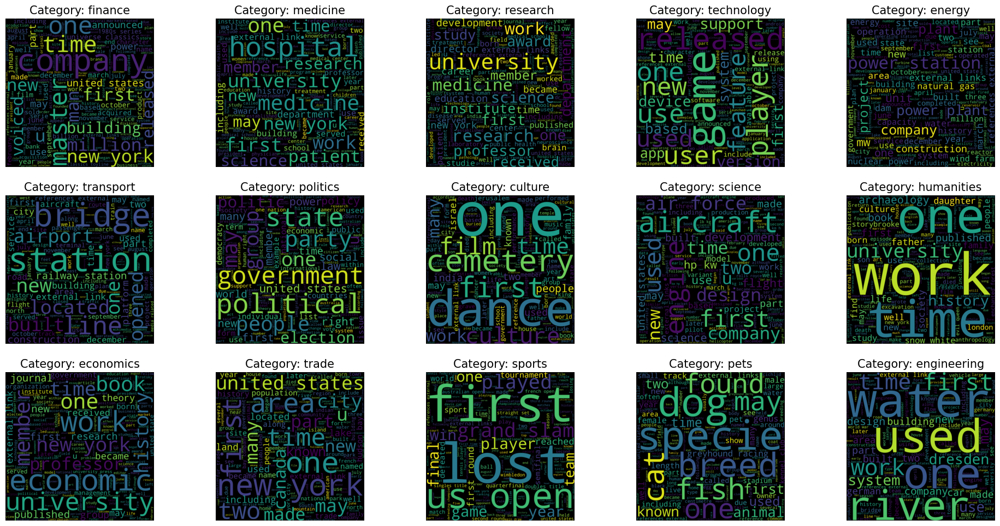

In [0]:
import matplotlib.pyplot as plt

stop_words = list(set(STOPWORDS.union(stopwords.words('english'))))

plt.figure(figsize=(20,10))
count=1
for category in categories:
    text = grouped_df.select("merged_documents").where(grouped_df.category==category).head()[0]
    wordcloud = WordCloud(width=2000, height=2000,
                          background_color ='black', margin=1,
                          stopwords = stop_words,
                          ).generate(text)
    plt.subplot(3,5,count)
    plt.axis("off")
    plt.title("Category: "+category,fontsize=15)
    plt.tight_layout(pad=2)
    plt.imshow(wordcloud,interpolation='bilinear')
    count=count+1
plt.show()